## The goal is to prepare the data in our /videos with labels_dataframe.csv to make it ready for finetuning Faster-R CNN

we first take a look at how faster r-cnn finetune data is structered

In [2]:
import os
import cv2
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import torch
from torchvision import models, transforms
from torch.utils.data import DataLoader
from torchvision.datasets import CocoDetection
import kagglehub
import shutil
from sklearn.model_selection import train_test_split
import json
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection import FasterRCNN
from torchvision.models.detection.rpn import AnchorGenerator
from torch.utils.data import Dataset
from PIL import Image
import torchvision.transforms as T
import torchvision.transforms.functional as F
from pycocotools.coco import COCO
from pycocotools.cocoeval import COCOeval
from torchvision.models.detection.backbone_utils import resnet_fpn_backbone
from torchvision.ops import MultiScaleRoIAlign
import contextlib
import io


c:\Users\ewald\Desktop\HBOICT\Semester 7 PreMaster\Acedemic Research Skills\Notebooks\UN- number-detection\env\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


we can go for the coco json annotation:
```dataset/
├── train/
│   ├── images/
│   │   ├── image1.jpg
│   │   ├── image2.jpg
│   └── annotations/
│       └── instances_train.json
├── val/
│   ├── images/
│   │   ├── image1.jpg
│   │   ├── image2.jpg
│   └── annotations/
│       └── instances_val.json

Sample COCO JSON annotation for one image:
{
    "images": [
        {"id": 1, "file_name": "image1.jpg", "height": 480, "width": 640},
        
    ],
    "annotations": [
        {"id": 1, "image_id": 1, "category_id": 1, "bbox": [100, 200, 50, 50], "area": 2500, "iscrowd": 0}
    ],
    "categories": [
        {"id": 1, "name": "object_class"}
    ]
}


or the Pascal VOC Format:
dataset/
├── train/
│   ├── images/
│   │   ├── image1.jpg
│   │   ├── image2.jpg
│   ├── annotations/
│       ├── image1.xml
│       ├── image2.xml

Sample XML annotation for one image:
<annotation>
    <folder>images</folder>
    <filename>image1.jpg</filename>
    <size>
        <width>640</width>
        <height>480</height>
    </size>
    <object>
        <name>object_class</name>
        <bndbox>
            <xmin>100</xmin>
            <ymin>200</ymin>
            <xmax>150</xmax>
            <ymax>250</ymax>
        </bndbox>
    </object>
</annotation>```


Right now the data looks like this:

In [3]:
df = pd.read_csv('data/labels_dataframe.csv')
df.head(20)

,Task ID,Task Name,Job Id,Source,Frames,Absolute Frame,Relative Frame,XTL,YTL,XBR,YBR,Code,Issue
0,138,Task1,133,1690279852.mp4,730,54,54,29.87,506.88,190.69,554.96,83/2789,NaN
1,138,Task1,133,1690279852.mp4,730,55,55,65.26,504.87,225.50,552.95,83/2789,NaN
2,138,Task1,133,1690279852.mp4,730,56,56,131.98,503.67,291.63,551.76,83/2789,NaN
3,138,Task1,133,1690279852.mp4,730,57,57,198.69,502.48,357.76,550.57,83/2789,NaN
4,138,Task1,133,1690279852.mp4,730,58,58,241.62,498.68,400.10,546.77,83/2789,NaN
5,138,Task1,133,1690279852.mp4,730,59,59,302.70,496.68,460.59,544.77,83/2789,NaN
6,138,Task1,133,1690279852.mp4,730,60,60,363.79,494.68,521.09,542.78,83/2789,NaN
7,138,Task1,133,1690279852.mp4,730,61,61,424.87,492.68,581.58,540.78,83/2789,NaN
8,138,Task1,133,1690279852.mp4,730,62,62,485.95,490.69,642.08,538.78,83/2789,NaN
9,138,Task1,133,1690279852.mp4,730,63,63,547.03,488.69,702.57,536.78,83/2789,NaN


The columns we need for COCO are:

images:
- ID
- File name
- height/width of the picture

annotations:
- ID
- Image_id
- category ID
- bounding box (coordinates)
- area (oppervlakte van bounding box)
- iscrowd (used to indicate whether an object is part of a "crowd" or a group of objects that cannot be easily separated)

categories:
- ID
- Category class (string)

We have all of these classes we just need to format them, except for the file_name but we can get this by loading the video and then get the frame of that video and then get the video file addressed to this

### Let's see what we need to do in order to fine tune Faster R-CNN

In [3]:
# Load pre-trained Faster R-CNN model
model = models.detection.fasterrcnn_resnet50_fpn(pretrained=True)

# Modify the classifier for custom classes
num_classes = 2  # 1 class + background
in_features = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = models.detection.faster_rcnn.FastRCNNPredictor(in_features, num_classes)

# Dataset and DataLoader
train_dataset = CocoDetection(root='dataset/train/images',
                              annFile='dataset/train/annotations/instances_train.json',
                              transform=transforms.ToTensor())

train_loader = DataLoader(train_dataset, batch_size=4, shuffle=True, collate_fn=lambda x: tuple(zip(*x)))

# Optimizer
optimizer = torch.optim.SGD(model.parameters(), lr=0.005, momentum=0.9, weight_decay=0.0005)

# Training Loop
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
model.to(device)

for epoch in range(10):
    model.train()
    for images, targets in train_loader:
        images = [img.to(device) for img in images]
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

        loss_dict = model(images, targets)
        losses = sum(loss for loss in loss_dict.values())

        optimizer.zero_grad()
        losses.backward()
        optimizer.step()

    print(f"Epoch {epoch}, Loss: {losses.item()}")


c:\Users\ewald\.conda\envs\pygpu\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\ewald\.conda\envs\pygpu\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=FasterRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=FasterRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


ModuleNotFoundError: No module named 'pycocotools'

We already have some images on Kaggle:

In [5]:
path = kagglehub.dataset_download("stanislavlevendeev/hazmat-detection")

100%|██████████| 400k/400k [00:00<00:00, 459kB/s]

Extracting files...


In [6]:
path

'C:\\Users\\ewald\\.cache\\kagglehub\\datasets\\stanislavlevendeev\\hazmat-detection\\versions\\13'

In [8]:
df = pd.read_csv(f'{path}/labels_dataframe.csv')
df.head()

,Task ID,Task Name,Job Id,Source,Frames,Absolute Frame,Relative Frame,XTL,YTL,XBR,YBR,Code,Issue
0,138,Task1,133,1690279852.mp4,730,54,54,29.87,506.88,190.69,554.96,83/2789,NaN
1,138,Task1,133,1690279852.mp4,730,55,55,65.26,504.87,225.50,552.95,83/2789,NaN
2,138,Task1,133,1690279852.mp4,730,56,56,131.98,503.67,291.63,551.76,83/2789,NaN
3,138,Task1,133,1690279852.mp4,730,57,57,198.69,502.48,357.76,550.57,83/2789,NaN
4,138,Task1,133,1690279852.mp4,730,58,58,241.62,498.68,400.10,546.77,83/2789,NaN


In [12]:
df[df["Source"] == "1693308534.mp4"]

,Task ID,Task Name,Job Id,Source,Frames,Absolute Frame,Relative Frame,XTL,YTL,XBR,YBR,Code,Issue
5588,169,Task31,165,1693308534.mp4,572,40703,109,3604.60,854.60,3840.00,1023.69,668/2927,vague characters
5589,169,Task31,165,1693308534.mp4,572,40704,110,3532.20,856.53,3772.02,1025.62,668/2927,vague characters
5590,169,Task31,165,1693308534.mp4,572,40705,111,3459.80,858.47,3704.03,1027.56,668/2927,vague characters
5591,169,Task31,165,1693308534.mp4,572,40706,112,3387.40,860.40,3636.05,1029.49,668/2927,vague characters
5592,169,Task31,165,1693308534.mp4,572,40707,113,3315.00,862.34,3568.07,1031.43,668/2927,vague characters
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6046,169,Task31,165,1693308534.mp4,572,41161,567,136.01,957.43,447.59,1136.40,668/2927,vague characters
6047,169,Task31,165,1693308534.mp4,572,41162,568,136.01,957.43,447.59,1136.40,668/2927,vague characters
6048,169,Task31,165,1693308534.mp4,572,41163,569,136.01,957.43,447.59,1136.40,668/2927,vague characters
6049,169,Task31,165,1693308534.mp4,572,41164,570,136.01,957.43,447.59,1136.40,668/2927,vague characters


# Frames from videos

In [13]:
# Path to the video directory
path_cluster = "/deepstore/datasets/dmb/ComputerVision/ProRail/Ivg/Videos"
path_local = "data/videos"
path_videos = path_local

# List video files in the directory
video_files = [f for f in os.listdir(path_videos) if f.endswith(('.mp4'))]

unique_videos = df["Source"].unique()

available_videos = [video for video in video_files if video in unique_videos]

available_videos

['1690279852.mp4', '1690281365.mp4', '1692875102.mp4', '1693308534.mp4']

In [56]:
# Path to the frames directory
frames_path = "data/frames_videos"

def get_frame(video, frame_number):
    # Open the video
    cap = cv2.VideoCapture(f"{path_videos}/{video}")
    # Set the frame number
    cap.set(cv2.CAP_PROP_POS_FRAMES, frame_number)
    # Read the frame
    ret, frame = cap.read()
    # Release the video
    cap.release()
    return frame

def save_frame(frame, video, frame_number, path):
    # Create the directory if it does not exist
    if not os.path.exists(path):
        os.makedirs(path)
    
    # fill for this format image_name_0000x.jpg where x is the frame number, could also be image_name_000xx.jpg or more x's
    frame_number = str(frame_number)
    while len(frame_number) < 5:
        frame_number = "0" + frame_number
    
    # Save the frame
    cv2.imwrite(f"{path}/{video}_{frame_number}.jpg", frame)

# loop over the df
for index, row in df.iterrows():
    if row["Source"] in available_videos:
        # these are the frames we want to extract
        print(row["Source"], row["Relative Frame"])
        # extract the frame
        frame = get_frame(row["Source"], row["Relative Frame"])

        video_name = row["Source"].split(".")[0]
        # save the frame
        save_frame(frame, video_name, row["Relative Frame"], frames_path)


1690279852.mp4 54
1690279852.mp4 55
1690279852.mp4 56
1690279852.mp4 57
1690279852.mp4 58
1690279852.mp4 59
1690279852.mp4 60
1690279852.mp4 61
1690279852.mp4 62
1690279852.mp4 63
1690279852.mp4 64
1690279852.mp4 65
1690279852.mp4 66
1690279852.mp4 67
1690279852.mp4 68
1690279852.mp4 69
1690279852.mp4 70
1690279852.mp4 71
1690279852.mp4 72
1690279852.mp4 73
1690279852.mp4 74
1690279852.mp4 75
1690279852.mp4 76
1690279852.mp4 77
1690279852.mp4 78
1690279852.mp4 79
1690279852.mp4 80
1690279852.mp4 81
1690279852.mp4 82
1690279852.mp4 83
1690279852.mp4 149
1690279852.mp4 150
1690279852.mp4 151
1690279852.mp4 152
1690279852.mp4 153
1690279852.mp4 154
1690279852.mp4 155
1690279852.mp4 156
1690279852.mp4 157
1690279852.mp4 158
1690279852.mp4 159
1690279852.mp4 160
1690279852.mp4 161
1690279852.mp4 162
1690279852.mp4 163
1690279852.mp4 164
1690279852.mp4 165
1690279852.mp4 166
1690279852.mp4 167
1690279852.mp4 168
1690279852.mp4 169
1690279852.mp4 170
1690279852.mp4 171
1690279852.mp4 172
1690

KeyboardInterrupt: 

In [57]:
# frames available
frames_path_list = os.listdir(frames_path)

In [58]:
# print all the filenames in the folder
print(frames_path_list)
print(len(frames_path_list))

['1690279852_00054.jpg', '1690279852_00055.jpg', '1690279852_00056.jpg', '1690279852_00057.jpg', '1690279852_00058.jpg', '1690279852_00059.jpg', '1690279852_00060.jpg', '1690279852_00061.jpg', '1690279852_00062.jpg', '1690279852_00063.jpg', '1690279852_00064.jpg', '1690279852_00065.jpg', '1690279852_00066.jpg', '1690279852_00067.jpg', '1690279852_00068.jpg', '1690279852_00069.jpg', '1690279852_00070.jpg', '1690279852_00071.jpg', '1690279852_00072.jpg', '1690279852_00073.jpg', '1690279852_00074.jpg', '1690279852_00075.jpg', '1690279852_00076.jpg', '1690279852_00077.jpg', '1690279852_00078.jpg', '1690279852_00079.jpg', '1690279852_00080.jpg', '1690279852_00081.jpg', '1690279852_00082.jpg', '1690279852_00083.jpg', '1690279852_00149.jpg', '1690279852_00150.jpg', '1690279852_00151.jpg', '1690279852_00152.jpg', '1690279852_00153.jpg', '1690279852_00154.jpg', '1690279852_00155.jpg', '1690279852_00156.jpg', '1690279852_00157.jpg', '1690279852_00158.jpg', '1690279852_00159.jpg', '1690279852_001

In [59]:
df.head()

,Task ID,Task Name,Job Id,Source,Frames,Absolute Frame,Relative Frame,XTL,YTL,XBR,YBR,Code,Issue
0,138,Task1,133,1690279852.mp4,730,54,54,29.87,506.88,190.69,554.96,83/2789,NaN
1,138,Task1,133,1690279852.mp4,730,55,55,65.26,504.87,225.50,552.95,83/2789,NaN
2,138,Task1,133,1690279852.mp4,730,56,56,131.98,503.67,291.63,551.76,83/2789,NaN
3,138,Task1,133,1690279852.mp4,730,57,57,198.69,502.48,357.76,550.57,83/2789,NaN
4,138,Task1,133,1690279852.mp4,730,58,58,241.62,498.68,400.10,546.77,83/2789,NaN


In [63]:
# get the rows from df that are in frames_path_list and make this into a new df

# create a new df
df_available = pd.DataFrame(columns=df.columns)

for i in range(len(frames_path_list)):
    file_name = frames_path_list[i]
    # Get the last part of the filename after splitting to "_"
    file_parts = file_name.split("_")

    first_part = file_parts[0]
    last_part = file_parts[-1]
    # Split the last part further at the point (".") and extract the first value
    frame_str = last_part.split(".")[0]
    frame_str = str(frame_str).lstrip("0") if frame_str != 0 else "0"
    if frame_str == "":
        frame_str = "0"
    first_part = first_part + ".mp4"
    # Filter rows in the original DataFrame
    matching_rows = df[
        (df["Source"] == first_part) &
        (df["Relative Frame"] == int(frame_str))
    ]
    # Append matching rows to df_available
    df_available = pd.concat([df_available, matching_rows], ignore_index=True)

df_available.head()

# then we create the annotations and we get the associated images

C:\Users\ewald\AppData\Local\Temp\ipykernel_13056\3575850257.py:25: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_available = pd.concat([df_available, matching_rows], ignore_index=True)


,Task ID,Task Name,Job Id,Source,Frames,Absolute Frame,Relative Frame,XTL,YTL,XBR,YBR,Code,Issue
0,138,Task1,133,1690279852.mp4,730,54,54,29.87,506.88,190.69,554.96,83/2789,NaN
1,138,Task1,133,1690279852.mp4,730,55,55,65.26,504.87,225.50,552.95,83/2789,NaN
2,138,Task1,133,1690279852.mp4,730,56,56,131.98,503.67,291.63,551.76,83/2789,NaN
3,138,Task1,133,1690279852.mp4,730,57,57,198.69,502.48,357.76,550.57,83/2789,NaN
4,138,Task1,133,1690279852.mp4,730,58,58,241.62,498.68,400.10,546.77,83/2789,NaN


In [64]:
df[(df["Source"] == "1690279852.mp4") & (df["Relative Frame"] == 54)]

,Task ID,Task Name,Job Id,Source,Frames,Absolute Frame,Relative Frame,XTL,YTL,XBR,YBR,Code,Issue
0,138,Task1,133,1690279852.mp4,730,54,54,29.87,506.88,190.69,554.96,83/2789,NaN


In [65]:
print(len(df_available))

114


In [66]:
# this df_available will be split in test, train, val

# Define split ratios
train_ratio = 0.8
val_ratio = 0.15
test_ratio = 0.05

# Step 1: Split into train and temp (combined val and test)
train, temp = train_test_split(df_available, test_size=(val_ratio + test_ratio), random_state=42)

# Step 2: Split temp into validation and test
val, test = train_test_split(temp, test_size=(test_ratio / (val_ratio + test_ratio)), random_state=42)

# Verify the splits
print(f"Training set: {len(train)} rows")
print(f"Validation set: {len(val)} rows")
print(f"Test set: {len(test)} rows")


Training set: 91 rows
Validation set: 17 rows
Test set: 6 rows


In [67]:
train.head()

,Task ID,Task Name,Job Id,Source,Frames,Absolute Frame,Relative Frame,XTL,YTL,XBR,YBR,Code,Issue
31,138,Task1,133,1690279852.mp4,730,150,150,85.01,508.09,246.92,552.25,83/2789,NaN
67,138,Task1,133,1690279852.mp4,730,248,248,516.00,489.29,671.37,533.44,83/2789,NaN
111,138,Task1,133,1690279852.mp4,730,442,442,1559.15,533.07,1713.28,611.78,83/2789,yellow plate
108,138,Task1,133,1690279852.mp4,730,439,439,1381.09,537.99,1535.21,616.69,83/2789,yellow plate
22,138,Task1,133,1690279852.mp4,730,76,76,1344.57,464.46,1495.38,512.56,83/2789,NaN


In [68]:
def get_annotations(image_directory, labeled_df, image_list):
    global annotation_id
    global image_id
    annotations = []
    for index, row in labeled_df.iterrows():
        # add the image to the image list
        image_name = row["Source"]
        # image_name remove the .mp4
        image_name = image_name.split(".")[0]
        image_frame = row["Relative Frame"]
        # fill for this format image_name_0000x.jpg where x is the frame number, could also be image_name_000xx.jpg or more x's
        frame_number = str(image_frame)
        while len(frame_number) < 5:
            frame_number = "0" + frame_number

        image_for_an_file_name = image_name + "_" + frame_number + ".jpg"
        #look up the immage in the image directory
        image_for_annotation_path = image_directory + "/" + image_for_an_file_name

        image_for_an = cv2.imread(image_for_annotation_path)
        # Check if the image was read successfully
        if image_for_an is not None:
            # Get the height and width of the image
            height, width, _ = image_for_an.shape
            image_id = image_id + 1
            # Append the image information to the list
            image_list.append({
                "id": image_id,  # Assign a unique ID starting from 1
                "file_name": image_for_an_file_name,
                "height": height,
                "width": width
            })

            x_left_top = row["XTL"]
            y_left_top = row["YTL"]
            x_right_bottom = row["XBR"]
            y_right_bottom = row["YBR"]
            # get the bounding box
            width = x_right_bottom - x_left_top
            height = y_right_bottom - y_left_top
            # calculate the area
            area = width * height
            # make the bbox
            bbox = [x_left_top, y_left_top, width, height]
            annotation_id = annotation_id + 1
            # append the annotation
            annotations.append({
                "id": annotation_id,
                "image_id": image_id,
                "category_id": 1,
                "bbox": bbox,
                "area": area,
                "iscrowd": 0
            })

    return annotations

In [69]:
# then we create the annotations and we get the associated images
path_for_images = frames_path

train_images = []
val_images = []
test_images = []

annotation_id = 0
image_id = 0
# image_directory, labeled_df, image_list
train_annotations = get_annotations(path_for_images, train, train_images)
val_annotations = get_annotations(path_for_images, val, val_images)
test_annotations = get_annotations(path_for_images, test, test_images)

print(train_annotations)
print(train_images)

[{'id': 1, 'image_id': 1, 'category_id': 1, 'bbox': [85.01, 508.09, 161.90999999999997, 44.160000000000025], 'area': 7149.945600000003, 'iscrowd': 0}, {'id': 2, 'image_id': 2, 'category_id': 1, 'bbox': [516.0, 489.29, 155.37, 44.150000000000034], 'area': 6859.585500000006, 'iscrowd': 0}, {'id': 3, 'image_id': 3, 'category_id': 1, 'bbox': [1559.15, 533.07, 154.12999999999988, 78.70999999999992], 'area': 12131.572299999978, 'iscrowd': 0}, {'id': 4, 'image_id': 4, 'category_id': 1, 'bbox': [1381.09, 537.99, 154.12000000000012, 78.70000000000005], 'area': 12129.244000000017, 'iscrowd': 0}, {'id': 5, 'image_id': 5, 'category_id': 1, 'bbox': [1344.57, 464.46, 150.81000000000017, 48.099999999999966], 'area': 7253.961000000003, 'iscrowd': 0}, {'id': 6, 'image_id': 6, 'category_id': 1, 'bbox': [904.36, 476.2, 161.90999999999997, 44.160000000000025], 'area': 7149.945600000003, 'iscrowd': 0}, {'id': 7, 'image_id': 7, 'category_id': 1, 'bbox': [1321.73, 539.63, 154.12999999999988, 78.7000000000000

In [70]:
# show each image to see if they contain a hazmat code
# for each annotation draw the bounding box on the image

# Iterate through annotations
def show_bounding_boxes(annotation_list, images_for_an_list, max_images=5):
    for annotation in annotation_list[:max_images]:
        # Get image details
        image_id = annotation["image_id"]
        image_info = next(image for image in images_for_an_list if image["id"] == image_id)  # Assuming train_images is a list of dictionaries
        image_path = os.path.join(path_for_images, image_info["file_name"])

        # Read the image
        image = cv2.imread(image_path)

        if image is None:
            print(f"Image not found: {image_path}")
            continue

        # Convert BGR (OpenCV format) to RGB (Matplotlib format)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        # Extract bounding box coordinates
        x, y, w, h = annotation["bbox"]
        x, y, w, h = int(x), int(y), int(w), int(h)

        # Plot the image
        plt.figure(figsize=(8, 8))
        plt.imshow(image)

        # Draw the bounding box
        plt.gca().add_patch(plt.Rectangle((x, y), w, h, edgecolor='green', facecolor='none', linewidth=2))

        # Display the image with the bounding box
        plt.title(f"Image ID: {image_id}")
        plt.axis("off")
        plt.show()

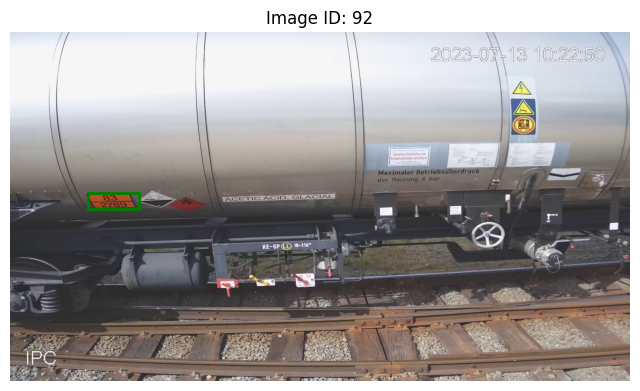

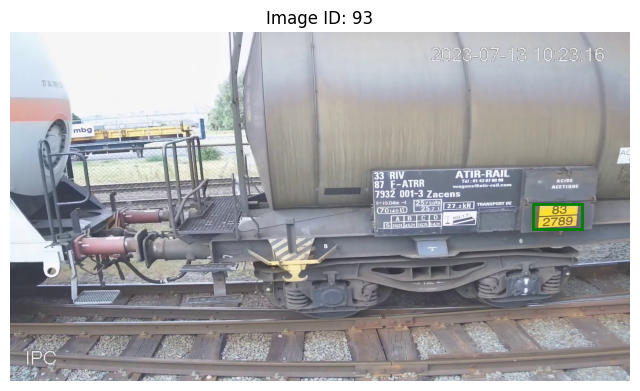

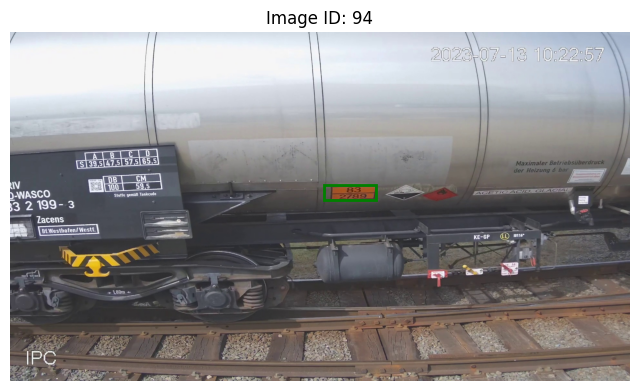

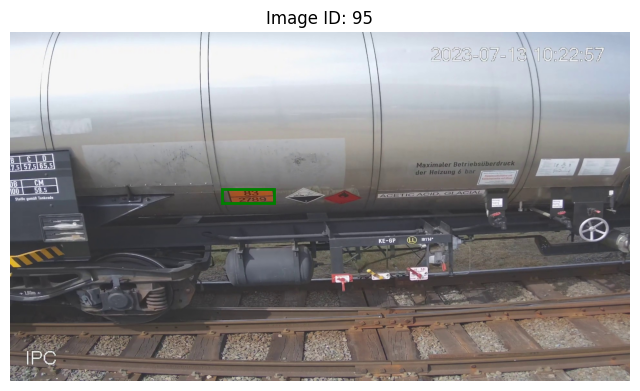

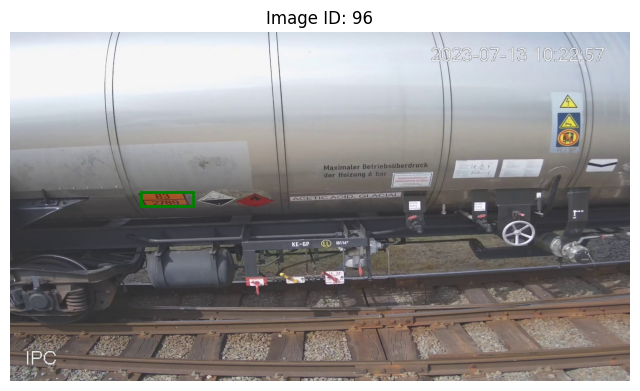

In [71]:
show_bounding_boxes(val_annotations, val_images)

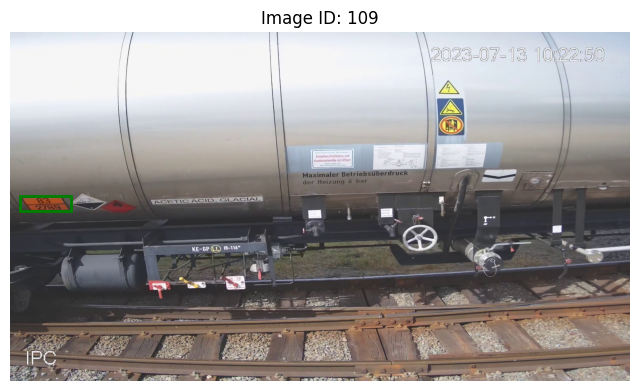

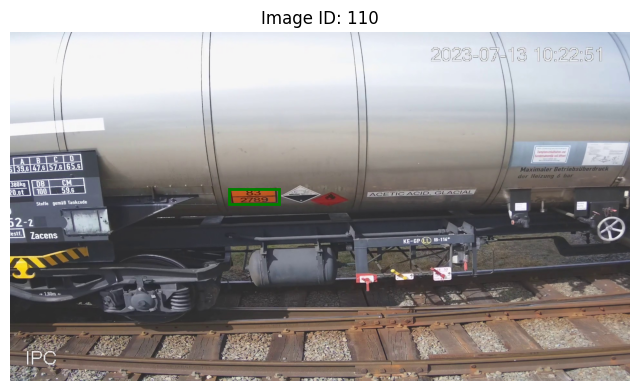

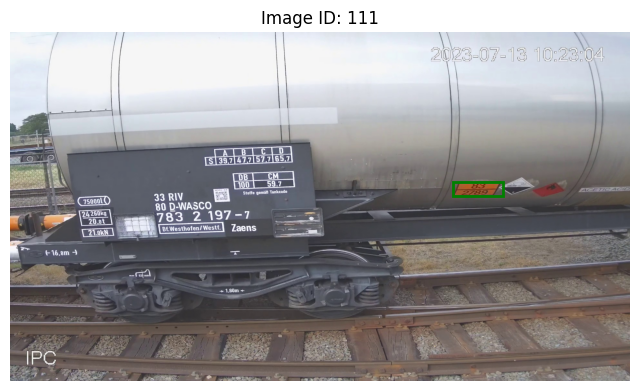

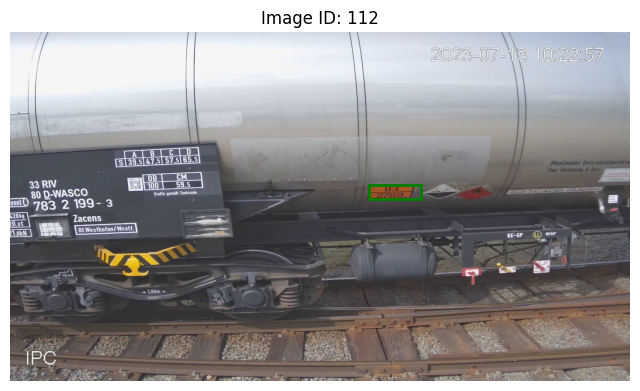

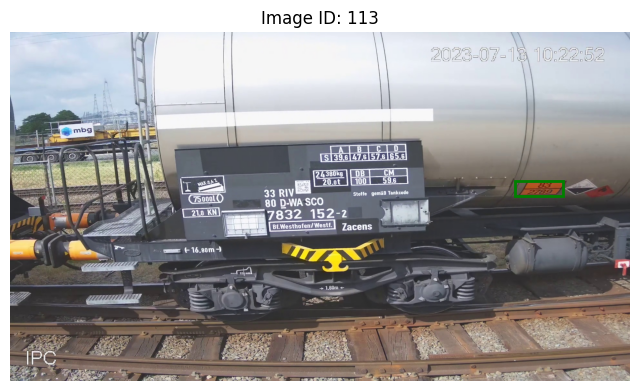

In [72]:
show_bounding_boxes(test_annotations, test_images)

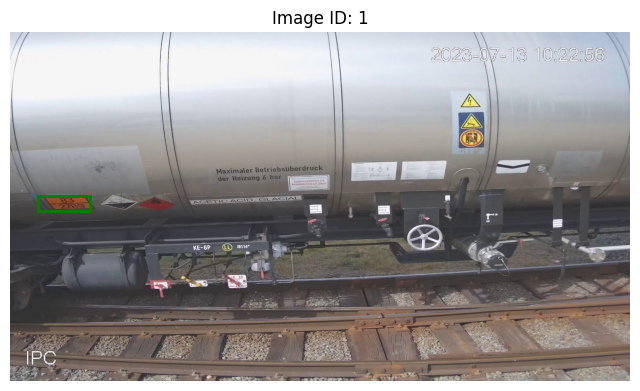

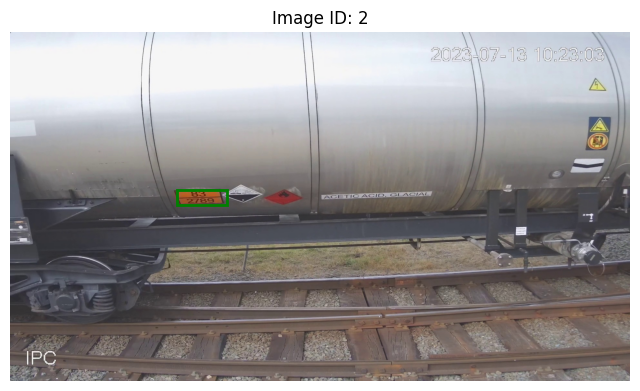

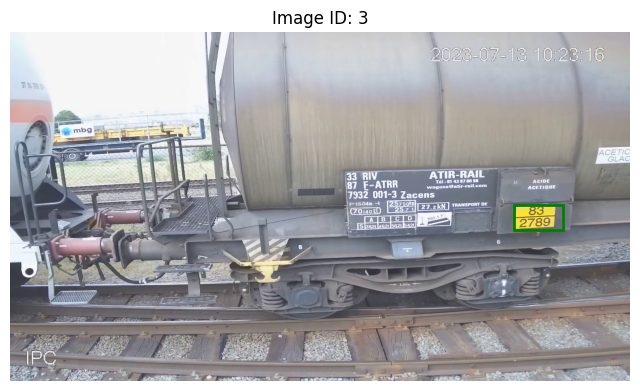

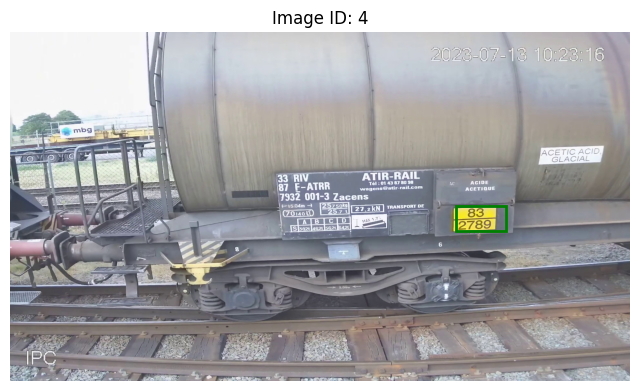

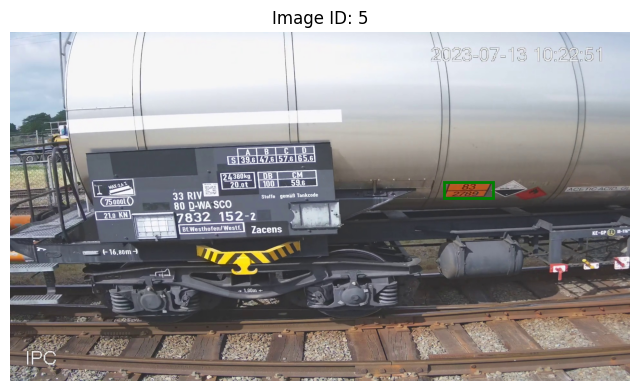

In [73]:
show_bounding_boxes(train_annotations, train_images)

In [74]:
# move the images to /data/data_faster_rcnn/{train, val or test}/images
# loop over train_images and move the images to /data/data_faster_rcnn/train/images

# Define the destination directory
destination_dir_test = "data/data_faster_rcnn/test/images"
destination_dir_val = "data/data_faster_rcnn/val/images"
destination_dir_train = "data/data_faster_rcnn/train/images"

#annotations data directories
destination_dir_test_annotations = "data/data_faster_rcnn/test/annotations"
destination_dir_val_annotations = "data/data_faster_rcnn/val/annotations"
destination_dir_train_annotations = "data/data_faster_rcnn/train/annotations"

# Empty the destination directories
empty_directories = True

if empty_directories:
    shutil.rmtree(destination_dir_test)
    shutil.rmtree(destination_dir_val)
    shutil.rmtree(destination_dir_train)
    shutil.rmtree(destination_dir_test_annotations)
    shutil.rmtree(destination_dir_val_annotations)
    shutil.rmtree(destination_dir_train_annotations)

# Create the destination directories if it does not exist
os.makedirs(destination_dir_test, exist_ok=True)
os.makedirs(destination_dir_val, exist_ok=True)
os.makedirs(destination_dir_train, exist_ok=True)
os.makedirs(destination_dir_test_annotations, exist_ok=True)
os.makedirs(destination_dir_val_annotations, exist_ok=True)
os.makedirs(destination_dir_train_annotations, exist_ok=True)

def move_images(image_list, destination_dir):
    for image in image_list:
        # Get the source and destination paths
        source_path = os.path.join(path_for_images, image["file_name"])
        destination_path = os.path.join(destination_dir, image["file_name"])
        # Move the image
        shutil.move(source_path, destination_path)

# Move images to the destination directory
move_images(train_images, destination_dir_train)
move_images(val_images, destination_dir_val)
move_images(test_images, destination_dir_test)


In [75]:
# create the annotations files in json
categories_list = [
    {"id": 1, "name": "hazmat code"}
]

# Create the dictionary
data_train = {
    "images": train_images,
    "annotations": train_annotations,
    "categories": categories_list
}

data_val = {
    "images": val_images,
    "annotations": val_annotations,
    "categories": categories_list
}

data_test = {
    "images": test_images,
    "annotations": test_annotations,
    "categories": categories_list
}

# Save the dictionaries as JSON files
def save_json(data, json_path):
    with open(json_path, "w") as file:
        json.dump(data, file)

save_json(data_train, destination_dir_train_annotations + "/instances_train.json")
save_json(data_val, destination_dir_val_annotations + "/instances_val.json")
save_json(data_test, destination_dir_test_annotations + "/instances_test.json")


annotations in train:


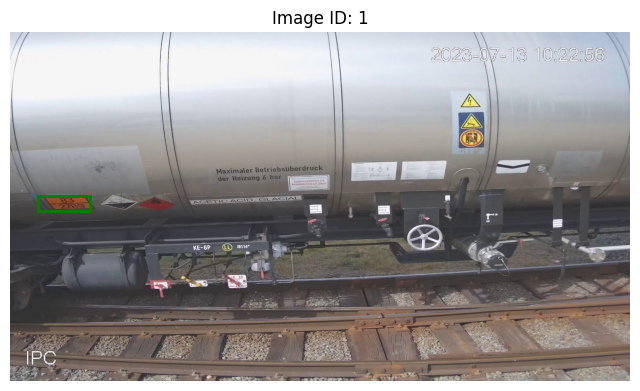

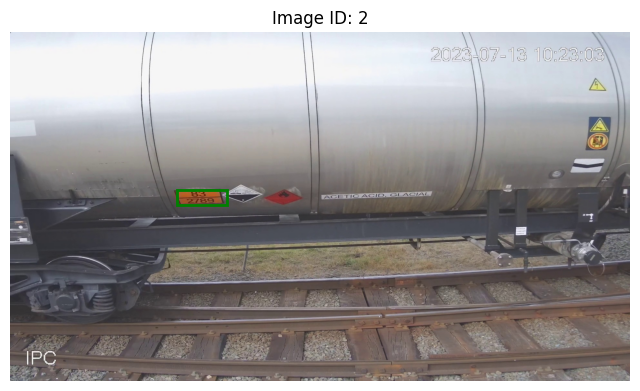

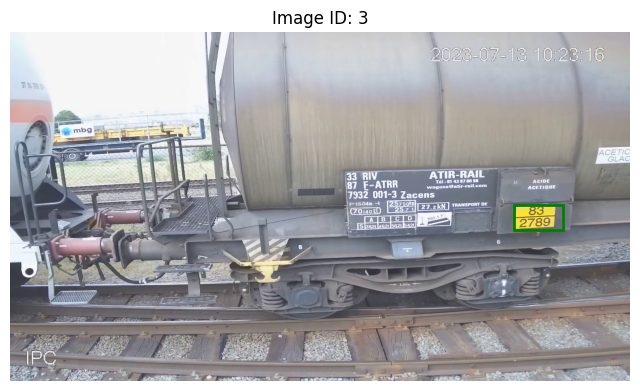

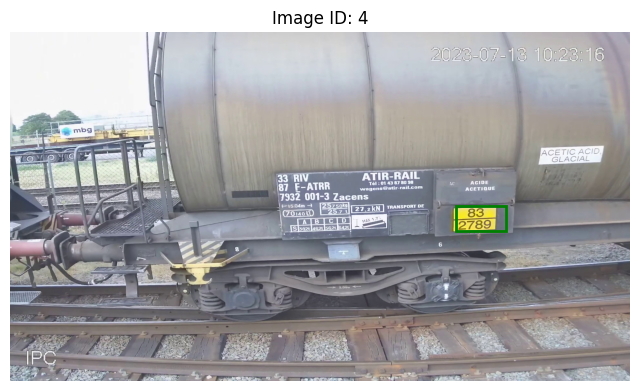

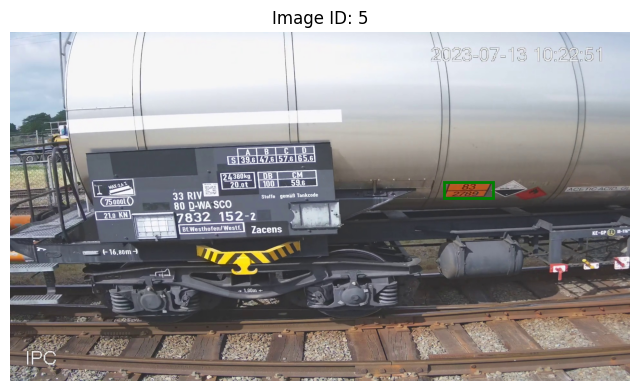

annotations in val:


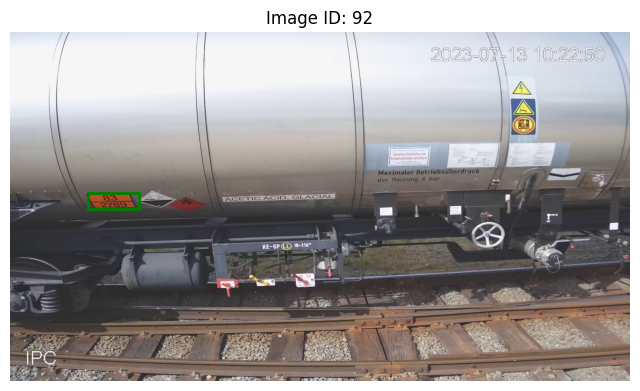

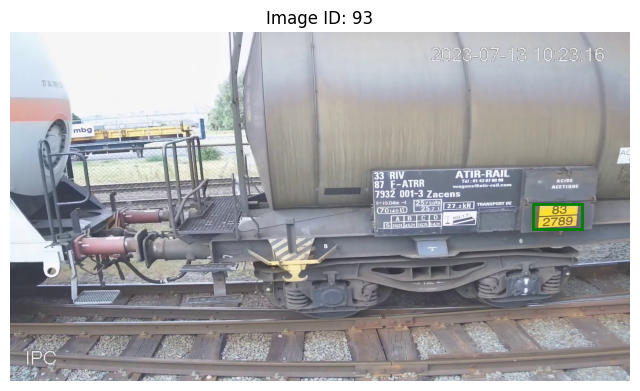

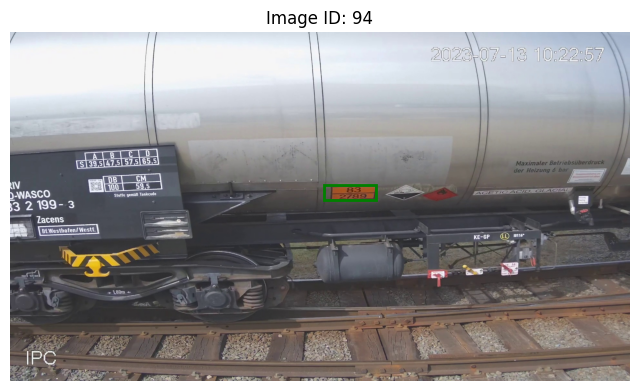

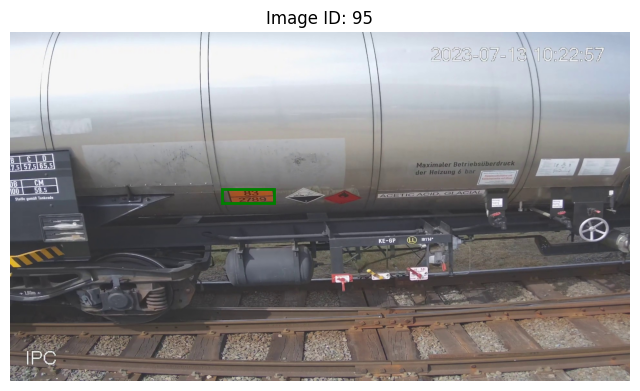

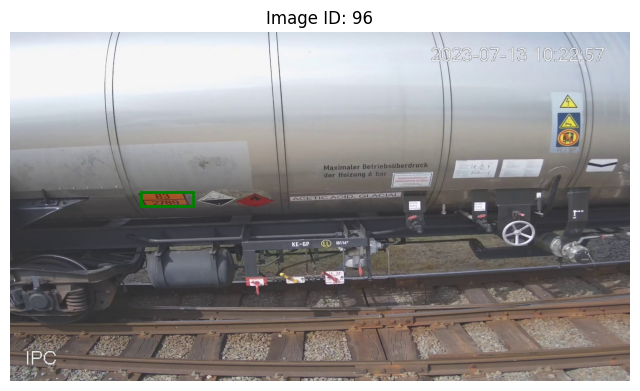

annotations in test:


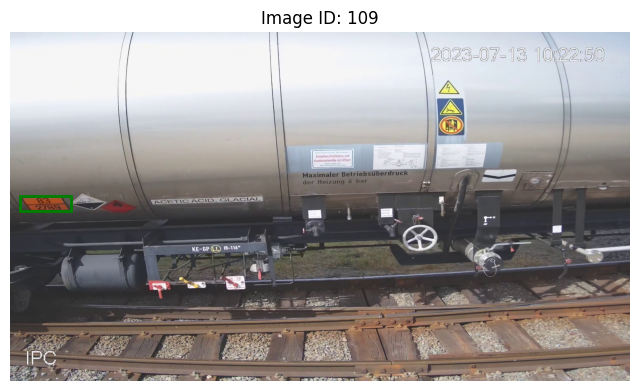

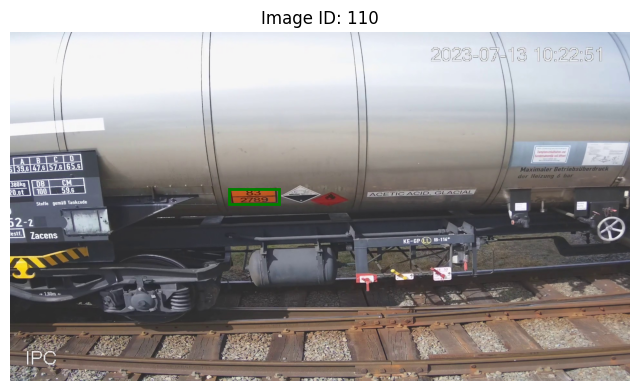

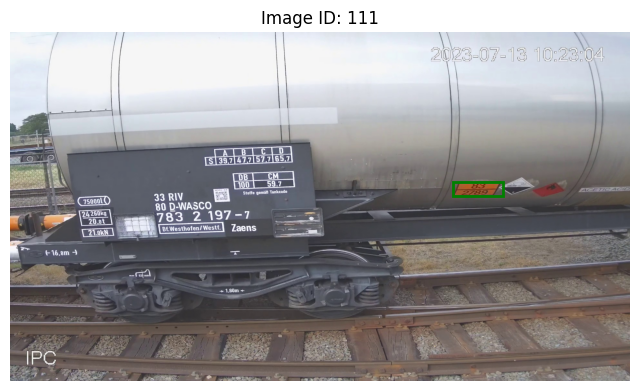

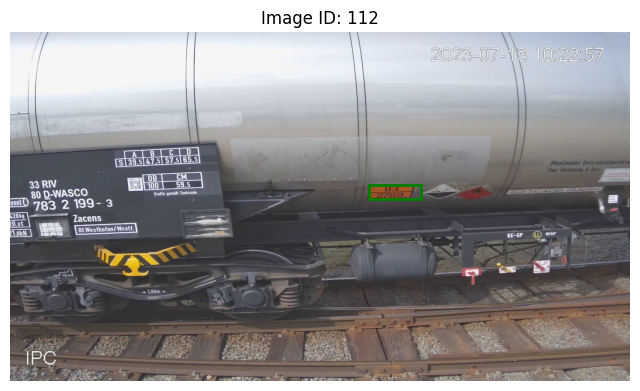

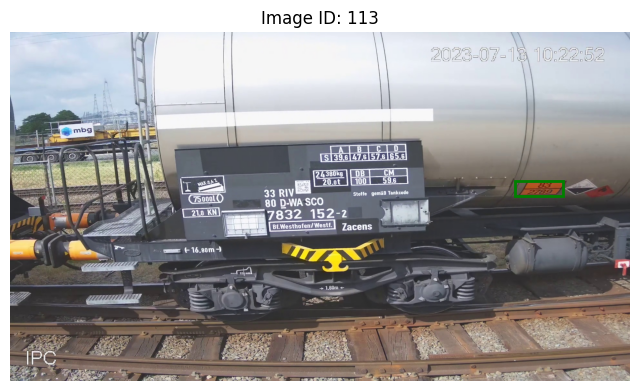

In [76]:
# check if all the images are in the right folder

# read the json files
def check_images_in_annotations(images_json, destination_dir, destination_dir_for_images, max_images=5):
    with open(destination_dir) as f:
        data = json.load(f)
        annotations = data["annotations"]
        for annotation in annotations[:max_images]:
            image_id = annotation["image_id"]
            images = data["images"]
            image = next((image for image in images if image["id"] == image_id), None)

            if image is None:
                print(f"Image not found for annotation: {annotation}")
            else:
                # show the image with bounding box
                # Read the image
                path_im = destination_dir_for_images + "/"+ image["file_name"]
                image = cv2.imread(path_im)
                if image is None:
                    print(f"Image not found: {path_im}")
                    continue

                # Convert BGR (OpenCV format) to RGB (Matplotlib format)
                image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

                # Extract bounding box coordinates
                x, y, w, h = annotation["bbox"]
                x, y, w, h = int(x), int(y), int(w), int(h)

                # Plot the image
                plt.figure(figsize=(8, 8))
                plt.imshow(image)

                # Draw the bounding box
                plt.gca().add_patch(plt.Rectangle((x, y), w, h, edgecolor='green', facecolor='none', linewidth=2))

                # Display the image with the bounding box
                plt.title(f"Image ID: {image_id}")
                plt.axis("off")
                plt.show()

print("annotations in train:")
check_images_in_annotations(data_train, destination_dir_train_annotations+"/instances_train.json", destination_dir_train)

print("annotations in val:")
check_images_in_annotations(data_val, destination_dir_val_annotations+"/instances_val.json", destination_dir_val)

print("annotations in test:")
check_images_in_annotations(data_test, destination_dir_test_annotations+"/instances_test.json", destination_dir_test)

In [13]:

# Define the dataset class
class HazmatDataset(Dataset):
    def __init__(self, data_dir, annotations_file, transforms=None):
        self.data_dir = data_dir
        self.transforms = transforms
        
        # Load annotations
        with open(annotations_file) as f:
            data = json.load(f)
        
        self.images = {img['id']: img for img in data['images']}
        self.annotations = data['annotations']
        
        # Create image_id to annotations mapping
        self.img_to_anns = {}
        for ann in self.annotations:
            img_id = ann['image_id']
            if img_id not in self.img_to_anns:
                self.img_to_anns[img_id] = []
            self.img_to_anns[img_id].append(ann)
        
        self.ids = list(self.images.keys())

    def __getitem__(self, idx):
        img_id = self.ids[idx]
        img_info = self.images[img_id]
        
        # Load image
        img_path = os.path.join(self.data_dir, 'images', img_info['file_name'])
        img = Image.open(img_path).convert('RGB')
        
        # Get annotations
        anns = self.img_to_anns.get(img_id, [])
        
        boxes = []
        labels = []
        areas = []
        iscrowd = []
        
        for ann in anns:
            bbox = ann['bbox']
            # Convert [x, y, w, h] to [x1, y1, x2, y2]
            boxes.append([
                bbox[0],
                bbox[1],
                bbox[0] + bbox[2],
                bbox[1] + bbox[3]
            ])
            labels.append(ann['category_id'])
            areas.append(ann['area'])
            iscrowd.append(ann['iscrowd'])
        
        # Convert to tensor
        boxes = torch.as_tensor(boxes, dtype=torch.float32)
        labels = torch.as_tensor(labels, dtype=torch.int64)
        areas = torch.as_tensor(areas, dtype=torch.float32)
        iscrowd = torch.as_tensor(iscrowd, dtype=torch.int64)
        
        target = {
            'boxes': boxes,
            'labels': labels,
            'image_id': torch.tensor([img_id]),
            'area': areas,
            'iscrowd': iscrowd
        }
        
        if self.transforms is not None:
            for transform in self.transforms:
                img, target = transform(img, target)
        
        return img, target

    def __len__(self):
        return len(self.ids)
    
class ToTensor(object):
    def __call__(self, image, target):
        # Convert PIL image to tensor
        image = F.to_tensor(image)
        return image, target

class RandomHorizontalFlip(object):
    def __init__(self, prob):
        self.prob = prob

    def __call__(self, image, target):
        if torch.rand(1) < self.prob:
            height, width = image.shape[-2:]
            image = F.hflip(image)
            # Flip bounding boxes
            bbox = target["boxes"]
            bbox[:, [0, 2]] = width - bbox[:, [2, 0]]  # Flip x-coordinates
            target["boxes"] = bbox
        return image, target

def get_transform(train):
    transforms = []
    # Convert PIL image to tensor
    transforms.append(ToTensor())
    if train:
        # Add training augmentations here if needed
        transforms.append(RandomHorizontalFlip(0.5))
    return transforms

def collate_fn(batch):
    return tuple(zip(*batch))

def train_one_epoch(model, optimizer, data_loader, device):
    model.train()
    total_loss = 0
    total_classifier_loss = 0
    total_box_reg_loss = 0
    total_objectness_loss = 0
    total_rpn_box_reg_loss = 0
    
    for images, targets in data_loader:
        images = list(image.to(device) for image in images)
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]
        
        loss_dict = model(images, targets)
        losses = sum(loss for loss in loss_dict.values())
        
        optimizer.zero_grad()
        losses.backward()
        optimizer.step()
        
        total_loss += losses.item()
        total_classifier_loss += loss_dict['loss_classifier'].item()
        total_box_reg_loss += loss_dict['loss_box_reg'].item()
        total_objectness_loss += loss_dict['loss_objectness'].item()
        total_rpn_box_reg_loss += loss_dict['loss_rpn_box_reg'].item()
    
    avg_loss = total_loss / len(data_loader)
    avg_classifier_loss = total_classifier_loss / len(data_loader)
    avg_box_reg_loss = total_box_reg_loss / len(data_loader)
    avg_objectness_loss = total_objectness_loss / len(data_loader)
    avg_rpn_box_reg_loss = total_rpn_box_reg_loss / len(data_loader)
    
    return avg_loss, avg_classifier_loss, avg_box_reg_loss, avg_objectness_loss, avg_rpn_box_reg_loss


# Load ground truth annotations
coco_val = COCO('data/data_faster_rcnn/val/annotations/instances_val.json')

# Prepare predictions in COCO format
# Assuming you have a function to convert model outputs to COCO format
# Conversion to COCO Format
def convert_to_coco_format(outputs, image_ids):
    coco_results = []
    for output, image_id in zip(outputs, image_ids):
        boxes = output['boxes'].cpu().numpy()
        scores = output['scores'].cpu().numpy()
        labels = output['labels'].cpu().numpy()
        
        for box, score, label in zip(boxes, scores, labels):
            coco_results.append({
                'image_id': image_id,
                'category_id': int(label),
                'bbox': [box[0], box[1], box[2] - box[0], box[3] - box[1]],
                'score': float(score)
            })
    return coco_results

# Validation Function
def validate(model, data_loader, coco_gt, device):
    model.eval()
    results = []
    
    with torch.no_grad():
        for images, targets in data_loader:
            images = list(image.to(device) for image in images)
            outputs = model(images)
            
            image_ids = [target['image_id'].item() for target in targets]
            coco_results = convert_to_coco_format(outputs, image_ids)
            results.extend(coco_results)
        
    if not results:
        print("No predictions generated. Skipping evaluation.")
        return 0.0
    
    # Suppress COCOeval output
    with contextlib.redirect_stdout(io.StringIO()):
        coco_dt = coco_gt.loadRes(results)
        coco_eval = COCOeval(coco_gt, coco_dt, 'bbox')
        coco_eval.evaluate()
        coco_eval.accumulate()
        coco_eval.summarize()
    
    return coco_eval.stats[0]

# Custom backbone to return a dictionary of feature maps
class BackboneWithChannels(torch.nn.Module):
    def __init__(self, backbone):
        super().__init__()
        self.backbone = backbone
    def forward(self, x):
        x = self.backbone(x)
        return {'0': x}
    
# Entire training loop for one epoch
def train_model(model, optimizer, train_loader, device, train_loss_list, val_map_list, best_val_map, lr_scheduler, val_loader, coco_val):
    # Train for one epoch
    train_loss, train_classifier_loss, train_box_reg_loss, train_objectness_loss, train_rpn_box_reg_loss = train_one_epoch(model, optimizer, train_loader, device)
    # Validate
    val_map = validate(model, val_loader, coco_val, device)

    # Collect loss and mAP
    train_loss_list.append(train_loss)
    val_map_list.append(val_map)

    # Get current learning rate
    current_lr = optimizer.param_groups[0]['lr']

    # Print detailed statistics
    print(f'Epoch {epoch}:')
    print(f'  Learning Rate: {current_lr:.6f}')
    print(f'  Train Loss: {train_loss:.4f}')
    print(f'    Classifier Loss: {train_classifier_loss:.4f}')
    print(f'    Box Regression Loss: {train_box_reg_loss:.4f}')
    print(f'    Objectness Loss: {train_objectness_loss:.4f}')
    print(f'    RPN Box Regression Loss: {train_rpn_box_reg_loss:.4f}')
    print(f'  Val mAP: {val_map:.4f}')
    
    # Update learning rate
    lr_scheduler.step()
    
    # Save latest checkpoint, overwriting the previous one
    torch.save({
        'epoch': epoch,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'train_loss': train_loss,
        'val_map': val_map,
    }, 'latest_checkpoint.pth')
    
    # Save best model if val_map is the highest so far
    if val_map > best_val_map:
        best_val_map = val_map
        torch.save({
            'epoch': epoch,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'train_loss': train_loss,
            'val_map': val_map,
        }, 'best_model.pth')

loading annotations into memory...
Done (t=0.00s)
creating index...
index created!


In [14]:
from collections import OrderedDict
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
print(f"Training model on {device}")

# Create datasets
train_dataset = HazmatDataset(
    data_dir='data/data_faster_rcnn/train',
    annotations_file='data/data_faster_rcnn/train/annotations/instances_train.json',
    transforms=get_transform(train=True)
)

val_dataset = HazmatDataset(
    data_dir='data/data_faster_rcnn/val',
    annotations_file='data/data_faster_rcnn/val/annotations/instances_val.json',
    transforms=get_transform(train=False)
)

# Create data loaders
train_loader = DataLoader(
    train_dataset,
    batch_size=2,
    shuffle=True,
    collate_fn=collate_fn,
    num_workers=0,
    pin_memory=True
)

val_loader = DataLoader(
    val_dataset,
    batch_size=1,
    shuffle=False,
    collate_fn=collate_fn,
    num_workers=0,
    pin_memory=True
)

# Initialize model
num_classes = 2  # hazmat code and background

# Create ResNet-101 backbone with FPN
backbone = resnet_fpn_backbone('resnet101', pretrained=True)

# Load the ResNet-101 model from the local cache
# model_path = '/home/s3549852/.cache/torch/hub/checkpoints/resnet101-63fe2227.pth'
# path = model_path
# # Check if the path exists
# if os.path.exists(path):
#     print(f"The path '{path}' exists.")
#     if os.path.isfile(path):
#         print(f"'{path}' is a file.")
#     elif os.path.isdir(path):
#         print(f"'{path}' is a directory.")
# else:
#     print(f"The path '{path}' does not exist.")
    
    
# model_state_dict = torch.load(model_path, weights_only=True)
# model_state_dict.eval()
# # Create ResNet-101 backbone with FPN

# backbone = resnet_fpn_backbone('resnet101', pretrained)
# backbone.load_state_dict(model_state_dict)

# Define anchor generator for FPN
anchor_generator = AnchorGenerator(
    sizes=((32,), (64,), (128,), (256,), (512,)),
    aspect_ratios=((0.5, 1.0, 2.0),) * 5
)

# Multi-scale RoI pooling for FPN
roi_pooler = MultiScaleRoIAlign(
    featmap_names=['0', '1', '2', '3', '4'],
    output_size=7,
    sampling_ratio=2
)

# Initialize Faster R-CNN with ResNet-101-FPN
model = FasterRCNN(
    backbone=backbone,
    num_classes=num_classes,
    rpn_anchor_generator=anchor_generator,
    box_roi_pool=roi_pooler
)

# Move model to device
model.to(device)
print(f"Training model on {device}")

# Initialize optimizer and scheduler
params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.SGD(params, lr=0.005, momentum=0.9, weight_decay=0.0005)
lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=3, gamma=0.1)

# Training loop
best_val_loss = float('inf')

num_epochs = 20
# Lists to store loss and mAP values
train_loss_list = []
val_map_list = []

best_val_map = float('-inf')

for epoch in range(num_epochs):
    train_model(model, optimizer, train_loader, device, train_loss_list, val_map_list, best_val_map, lr_scheduler, val_loader, coco_val)

c:\Users\ewald\.conda\envs\pygpu\lib\site-packages\torchvision\models\_utils.py:135: UserWarning: Using 'backbone_name' as positional parameter(s) is deprecated since 0.13 and may be removed in the future. Please use keyword parameter(s) instead.
  warnings.warn(
c:\Users\ewald\.conda\envs\pygpu\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\ewald\.conda\envs\pygpu\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet101_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet101_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


cpu
Number of predictions: 31
Epoch 0:
  Learning Rate: 0.005000
  Train Loss: 0.9758
    Classifier Loss: 0.3308
    Box Regression Loss: 0.0159
    Objectness Loss: 0.6257
    RPN Box Regression Loss: 0.0033
  Val mAP: 0.0000


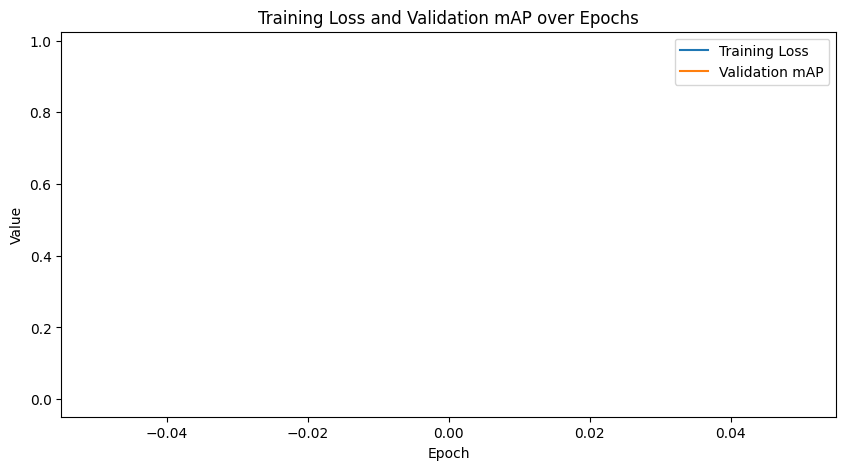

In [16]:
import matplotlib.pyplot as plt

draw_epochs = len(val_map_list)

# Plotting the training loss and validation mAP
plt.figure(figsize=(10, 5))

# Zorg ervoor dat de x-as begint bij 1
plt.plot(range(1, draw_epochs + 1), train_loss_list, label='Training Loss')
plt.plot(range(1, draw_epochs + 1), val_map_list, label='Validation mAP')

# Stel de x-as ticks handmatig in
plt.xticks(range(1, draw_epochs + 1))  # Specificeer alle epochs (1, 2, 3, ...)

plt.xlabel('Epoch')
plt.ylabel('Value')
plt.title('Training Loss and Validation mAP over Epochs')
plt.legend()
plt.grid(True)  # Optioneel, voor een beter overzicht
plt.show()


In [8]:
# Load the model
model_path = 'best_model.pth'  # Replace with your checkpoint path
checkpoint = torch.load(model_path, map_location=device)

model.load_state_dict(checkpoint['model_state_dict'])
model.eval()  # Set the model to evaluation mode

C:\Users\ewald\AppData\Local\Temp\ipykernel_2200\835333504.py:3: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(model_path, map_location=device)


FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithChannels(
    (backbone): Sequential(
      (0): Conv2dNormActivation(
        (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU6(inplace=True)
      )
      (1): InvertedResidual(
        (conv): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
            (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (2): ReLU6(inplace=True)
          )
          (1): Conv2d(32, 16, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (2): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=Tru

In [10]:
def load_image(image_path, transforms=None):
    image = Image.open(image_path).convert('RGB')
    if transforms:
        for transform in transforms:
            image, _ = transform(image, target=None)  # No target during inference
    return image

# Define preprocessing transforms
test_transforms = get_transform(train=False)

# Load the image
image_path = 'images\hazard_plate.jpg'  # Replace with your image path
image = load_image(image_path, transforms=test_transforms)
image = image.to(device)

In [11]:
# Wrap the image in a list as the model expects a batch
with torch.no_grad():
    predictions = model([image])

In [14]:
import matplotlib.pyplot as plt
import numpy as np

def draw_predictions(image, predictions, threshold=0.5, classes=['background', 'hazmat']):
    # Convert image from tensor to numpy array
    image = image.cpu().permute(1, 2, 0).numpy()
    image = np.clip(image * 255, 0, 255).astype(np.uint8)
    
    boxes = predictions[0]['boxes'].cpu().numpy()
    labels = predictions[0]['labels'].cpu().numpy()
    scores = predictions[0]['scores'].cpu().numpy()
    
    # Filter predictions based on confidence threshold
    keep = scores >= threshold
    boxes = boxes[keep]
    labels = labels[keep]
    scores = scores[keep]
    
    fig, ax = plt.subplots(1, figsize=(12, 9))
    ax.imshow(image)
    
    for box, label, score in zip(boxes, labels, scores):
        if label == 1:  # Only plot hazmat codes
            x1, y1, x2, y2 = box
            rect = plt.Rectangle((x1, y1), x2 - x1, y2 - y1, fill=False, color='blue', linewidth=2)
            ax.add_patch(rect)
            label_name = classes[label]
            ax.text(x1, y1, f'{label_name}: {score:.2f}', color='white', backgroundcolor='blue', fontsize=12)
    
    plt.show()

In [23]:
def predict_image(image_path, threshold=0.5):
    # List of class names
    classes = ['background', 'hazmat']
    
    # Load the image
    image = load_image(image_path, transforms=test_transforms)
    image = image.to(device)
    
    # Wrap the image in a list as the model expects a batch
    with torch.no_grad():
        predictions = model([image])
    
    # Filter predictions based on threshold
    boxes = predictions[0]['boxes'].cpu().numpy()
    labels = predictions[0]['labels'].cpu().numpy()
    scores = predictions[0]['scores'].cpu().numpy()
    
    # Apply threshold filter
    keep = scores >= threshold
    boxes = boxes[keep]
    labels = labels[keep]
    scores = scores[keep]
    
    # Print the predictions
    if len(boxes) == 0:
        print("No predictions meet the threshold.")
    else:
        print("Predictions:")
        for label, score in zip(labels, scores):
            class_name = classes[label]
            print(f"  {class_name}: {score:.2f}")
        # Display the predictions
        draw_predictions(image, predictions, threshold=threshold, classes=classes)

Predictions:
  hazmat: 0.30


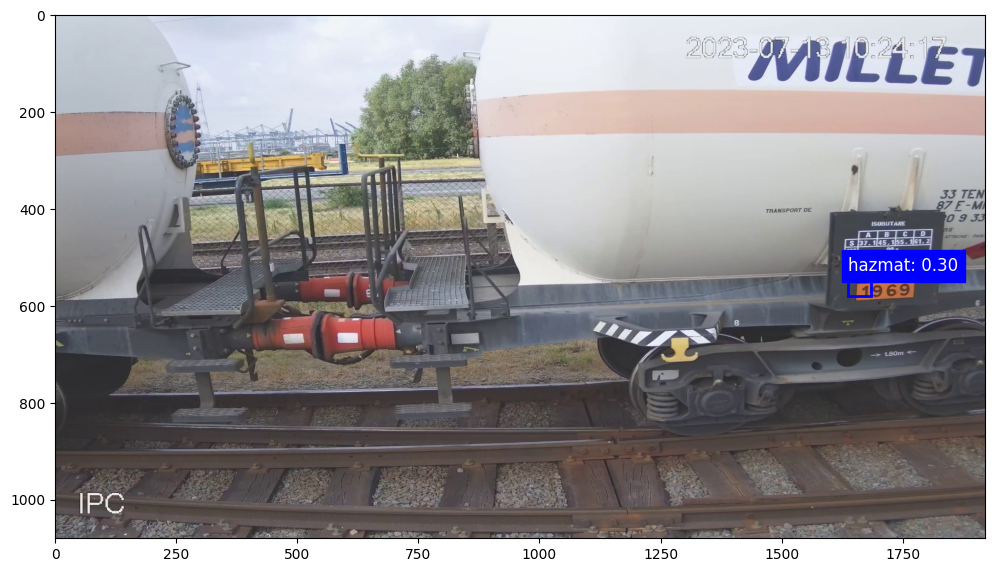

In [26]:
predict_image('data/data_faster_rcnn/val/images/1690281365_00595.jpg', threshold=0.29)

No predictions meet the threshold.


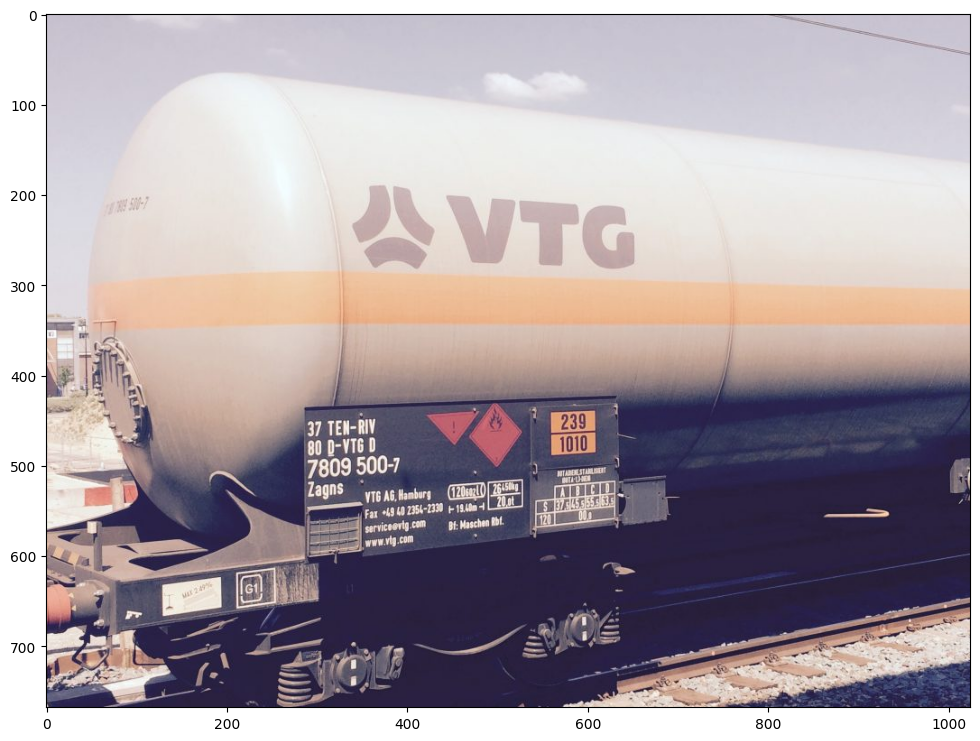

In [28]:
predict_image('images/hazard_plate.jpg', threshold=0)

### CODE BELOW IS WORK IN PROGRESS !BROKEN!

In [84]:


from utils.dataset import CocoDataset
# Load pre-trained Faster R-CNN model
model = models.detection.fasterrcnn_resnet50_fpn(pretrained=True)

# Modify the classifier for custom classes
num_classes = 2  # 1 class + background
in_features = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = models.detection.faster_rcnn.FastRCNNPredictor(in_features, num_classes)

# Dataset and DataLoader
train_dataset = CocoDataset(root='data/data_faster_rcnn/train/images',
                              annFile='data/data_faster_rcnn/train/annotations/instances_train.json',
                              transform=transforms.ToTensor())

train_loader = DataLoader(train_dataset, batch_size=4, shuffle=True, collate_fn=lambda x: tuple(zip(*x)))


Note: you may need to restart the kernel to use updated packages.
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Created wheel for utils: filename=utils-1.0.2-py2.py3-none-any.whl size=13936 sha256=e81b8ce2a428ee1fa77e619a54785ff7f2e5f807d6da3f07f60984144ec10cb7
  Stored in directory: c:\users\ewald\appdata\local\pip\cache\wheels\b8\39\f5\9d0ca31dba85773ececf0a7f5469f18810e1c8a8ed9da28ca7
Successfully built utils
Note: you may need to restart the kernel to use updated packages.


ModuleNotFoundError: No module named 'utils.dataset'

In [69]:
train_dataset

Dataset CocoDetection
    Number of datapoints: 14
    Root location: data/data_faster_rcnn/train/images
    StandardTransform
Transform: ToTensor()

In [81]:
train_dataset.get_classnames()

AttributeError: 'CocoDetection' object has no attribute 'get_classnames'

In [73]:
# Optimizer
optimizer = torch.optim.SGD(model.parameters(), lr=0.005, momentum=0.9, weight_decay=0.0005)

# Training Loop
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
model.to(device)

for epoch in range(10):
    model.train()
    for images, targets in train_loader:
        images = [img.to(device) for img in images]

        # Transform targets to expected format
        processed_targets = []
        for target_list in targets:  # Iterate through each batch
            boxes = []
            labels = []
            for obj in target_list:  # Process each object's annotations
                x_min, y_min, width, height = obj["bbox"]
                x_max = x_min + width
                y_max = y_min + height

                # Ensure the box has valid dimensions
                if width > 0 and height > 0:
                    boxes.append([x_min, y_min, x_max, y_max])
                    labels.append(obj["category_id"])

            # Convert to tensors
            processed_target = {
                "boxes": torch.tensor(boxes, dtype=torch.float32),
                "labels": torch.tensor(labels, dtype=torch.int64),
            }
            processed_targets.append(processed_target)

        targets = [{k: v.to(device) for k, v in t.items()} for t in processed_targets]

        # Forward pass and loss computation
        loss_dict = model(images, targets)
        losses = sum(loss for loss in loss_dict.values())


    print(f"Epoch {epoch}, Loss: {losses.item()}")


Epoch 0, Loss: 1.0352821350097656
Epoch 1, Loss: 1.0344630479812622
Epoch 2, Loss: 1.0414433479309082
Epoch 3, Loss: 1.0503230094909668
Epoch 4, Loss: 1.0444495677947998
Epoch 5, Loss: 1.061553716659546
Epoch 6, Loss: 1.085394263267517
Epoch 7, Loss: 1.0300111770629883
Epoch 8, Loss: 1.0484620332717896
Epoch 9, Loss: 1.0295648574829102


In [76]:
path

'C:\\Users\\ewald\\.cache\\kagglehub\\datasets\\stanislavlevendeev\\hazmat-detection\\versions\\11'

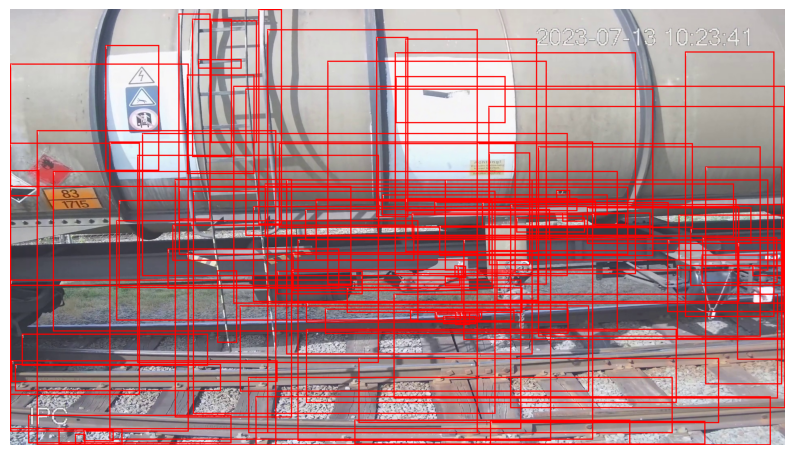

In [77]:


# Function to visualize the bounding boxes on the image
def visualize_predictions(image_path, model, device, threshold=0.5):
    # Load image and apply the necessary transformations (to tensor)
    image = Image.open(image_path).convert("RGB")
    transform = transforms.Compose([
        transforms.ToTensor(),
    ])
    image_tensor = transform(image).unsqueeze(0).to(device)  # Add batch dimension and move to device

    # Run the model to get predictions
    model.eval()
    with torch.no_grad():
        prediction = model(image_tensor)

    # Get the predicted boxes, labels, and scores
    boxes = prediction[0]['boxes']
    labels = prediction[0]['labels']
    scores = prediction[0]['scores']

    # Filter out boxes with low scores
    boxes = boxes[scores > threshold]
    labels = labels[scores > threshold]
    
    # Draw the boxes on the image
    draw = ImageDraw.Draw(image)
    
    for box, label in zip(boxes, labels):
        x_min, y_min, x_max, y_max = box.tolist()  # Convert box to list for easy manipulation
        draw.rectangle([x_min, y_min, x_max, y_max], outline="red", width=3)
        draw.text((x_min, y_min), str(label.item()), fill="white")
    
    # Show the image with bounding boxes
    plt.figure(figsize=(10, 10))
    plt.imshow(image)
    plt.axis('off')  # Hide axes
    plt.show()

# Example usage:
image_path = path + '/yolo/images/train/1690281365_00053.jpg'
visualize_predictions(image_path, model, device)


hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazmat code
hazm

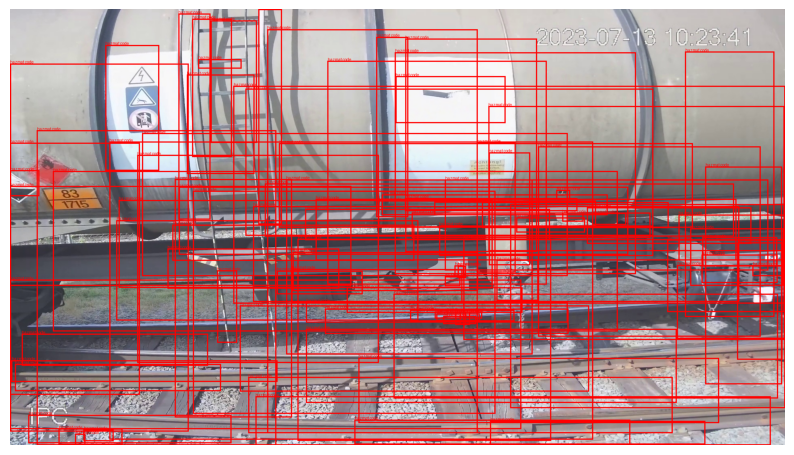

In [80]:
import torch
from torchvision import transforms
from PIL import Image, ImageDraw, ImageFont
import matplotlib.pyplot as plt

# Function to visualize the bounding boxes for a specific category and print labels
def visualize_predictions(image_path, model, device, target_category_id, category_names, threshold=0.5):
    # Load image and apply the necessary transformations (to tensor)
    image = Image.open(image_path).convert("RGB")
    transform = transforms.Compose([
        transforms.ToTensor(),
    ])
    image_tensor = transform(image).unsqueeze(0).to(device)  # Add batch dimension and move to device

    # Run the model to get predictions
    model.eval()
    with torch.no_grad():
        prediction = model(image_tensor)

    # Get the predicted boxes, labels, and scores
    boxes = prediction[0]['boxes']
    labels = prediction[0]['labels']
    scores = prediction[0]['scores']
    # Filter out boxes that belong to the target category and have a score above the threshold
    target_boxes = []
    target_labels = []
    for box, label, score in zip(boxes, labels, scores):
        if label.item() == target_category_id and score > threshold:
            target_boxes.append(box)
            target_labels.append(label)

    # Draw the boxes and labels on the image
    draw = ImageDraw.Draw(image)
    
    for box, label in zip(target_boxes, target_labels):
        x_min, y_min, x_max, y_max = box.tolist()  # Convert box to list for easy manipulation
        draw.rectangle([x_min, y_min, x_max, y_max], outline="red", width=3)
        
        # Get the label name (use category_names dictionary)
        label_name = category_names.get(label.item(), "Unknown")
        print(label_name)
        # Draw the label text next to the bounding box
        draw.text((x_min, y_min - 10), label_name, fill="red")  # Adjust the position as needed
    
    # Show the image with bounding boxes and labels
    plt.figure(figsize=(10, 10))
    plt.imshow(image)
    plt.axis('off')  # Hide axes
    plt.show()

# Example usage:
target_category_id = 1  # Replace with the category ID you're interested in (e.g., 1 for "person")

# Define category names (this can be a dictionary with category ID to name mappings)
category_names = {1: "hazmat code", 2: "bicycle", 3: "car", 4: "dog", 5: "cat"}  # Modify based on your dataset

visualize_predictions(image_path, model, device, target_category_id, category_names)
